# Lab 3: Digital Filtering and Applications

Instructor: Prof. Lillian Jane Ratliff

Teaching Assistants: Ashwin Srinivas Badrinath and Kevin Lin

Students: Peter Michael & Guo Zhengao

## Abstract

The purpose of this lab is to experiment different digital LTI filters; the finite impulse response filter (FIR) and infinite impulse response filter (IIR). We will examine the characteristics of the filers in both time and frequency dominan. We will also get familiar with the design and implementations of the digital filters in application such as music equalizer and audio recovering!

## Introduction

The first part of the lab consist of learning how to implement a moving average filter using Python's built-in syntaxes. The second part of the lab focuses on analyzing the characteristics of both FIR and IIR filters. This includes analyzing the filters in the time and frequency domain. Finally, the last part of the lab consists of designing an audio equalizers using three different types of  IIR filters.

In [78]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
import simpleaudio as sa
from scipy.io import wavfile
import scipy.io.wavfile as wav
import scipy
import scipy.io as sio
from scipy.signal import butter, lfilter
from scipy.signal import freqz
from scipy.io import wavfile
from IPython.display import Audio
from pydub import AudioSegment # allows conversion from mp3 to wav
from skimage import util
from numpy.fft import fft, fftshift
import csv

## Task1: FIR filters and frequency response

First of all, load a data which consists of a 100-second sinusoidal signals with random noise. We will use the moving average filter to remove the noise. 

For this task applied a 30 second moving average filter give by the equation:

$y[n] = (1/30)(x[n] + x[n-1] + ….+ x[n-29])$ 

which correspond to the impulse response:

$h[n]= (1/30)(u[n] -u[n-30)$ 

We will filter out the noise with two different methods. 
(1) Convolution
(2) FIR filter

Here you will need to use Python built-in filter function, `signal.convolve` and `signal.Ifilter`. 




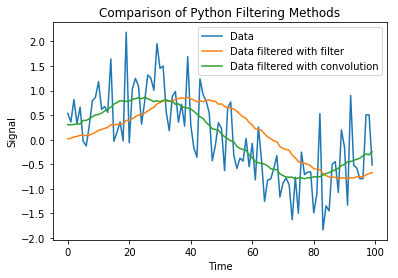

Text(0, 0.5, 'Magnitude')

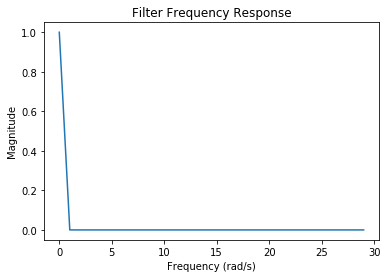

In [79]:
# Load the 100-second signal
data = np.genfromtxt('signal_data.txt')

# Creat an impulse response h[𝑛]= 1/30*(𝑢[𝑛]−𝑢[𝑛−30]). Hint: you can use np.ones
h = 1/30 * np.ones(30)

# Apply this filter to the 100-second signal using both lfilter and convolve.
# Hint: you can simply use Python's built-in filters: signal.lfilter
y_lfilter = signal.lfilter(h, 1, data)

# Hint: you can simply use Python's built-in filters: signal.convolve
y_convolve = signal.convolve(data,h,mode='same')

# Plot the filtering results
plt.plot(data,label='Data')
plt.plot(y_lfilter,label='Data filtered with filter')
plt.plot(y_convolve,label='Data filtered with convolution')
plt.ylabel('Signal')
plt.xlabel('Time')
plt.title('Comparison of Python Filtering Methods')
plt.legend()
plt.show()

# Show the system frequency response
# Hint: compute fft of the impulse response to find frequency response. You can use np.fft.fft
H = np.fft.fft(h)
plt.plot(H)
plt.title('Filter Frequency Response')
plt.xlabel('Frequency (rad/s)')
plt.ylabel('Magnitude')

### Does the filtered result look smoother? 
Yes, the filtered result looks much smoother.

### Is the filter low pass? 
Yes, this filter is low pass.

### How would you adjust the implementations so that they give identical results?
I would implement a phase shift to make them give identical results.

## Task 2: Analyze the Characteristics of Filters

The second task is to analyze the characteristics of different filters. First, we will use the provided `analyze` function from the appendix and apply it to 4 different filters with `an order of 10` and a `cutoff frequency of 0.1 pi`.


Followings are 4 different filters you need to analyze:

1. Low pass Butterworth filter
2. Low pass Window-method filter
3. High pass Butterworth filter
4. High pass Window-method filter 

After executing and analyzing all four filters, we will apply each to two other external signals and plotted comparison of different filtering methods. 

Followings are two original signals. 
1. The data in `microsoft_stock.txt`
2. A pulse of length 20: 𝑥[𝑛]=𝑢[𝑛]−𝑢[𝑛−20]


In [80]:
def analyze(b, a, title):
    b = np.reshape(b, -1)
    a = np.reshape(a, -1)
    fig = plt.figure(figsize=(10, 8))
    fig.suptitle(title, fontsize='x-large')
    fig.subplots_adjust(hspace=0.5, wspace=0.3)

    # Plot frequency response
    w, h = signal.freqz(b, a, 1024)
    w_majors = np.array([0, 0.2, 0.4, 0.6, 0.8, 1]) * np.pi
    w_labels = ['0', r'$0.2\pi$', r'$0.4\pi$', r'$0.6\pi$', r'$0.8\pi$', r'$\pi$']
    ax = fig.add_subplot(221)
    ax.plot(w, 20 * np.log10(np.abs(h)))
    ax.set_xticks(w_majors)
    ax.set_xticklabels(w_labels)
    ax.set_title('Magnitude Response')
    ax.set_xlabel('Frequency [rad]')
    ax.set_ylabel('Gain [dB]')
    ax = fig.add_subplot(222)
    ax.plot(w, np.rad2deg(np.unwrap(np.angle(h))))
    ax.set_xticks(w_majors)
    ax.set_xticklabels(w_labels)
    ax.set_title('Phase Response')
    ax.set_xlabel('Frequency [rad]')
    ax.set_ylabel('Phase [deg]')

    # Plot impulse response
    x = np.zeros(50)
    x[0] = 1
    y = signal.lfilter(b, a, x)
    ax = fig.add_subplot(223)
    ax.stem(np.arange(len(y)), y)
    ax.set_title('Impulse Response')
    ax.set_xlabel('Time')
    ax.set_ylabel('Output')

    # Plot poles & zeros
    n_taps = max(len(b), len(a))
    b = np.pad(b, (0, n_taps - len(b)), 'constant')
    a = np.pad(a, (0, n_taps - len(a)), 'constant')
    z, p, k = signal.tf2zpk(b, a)
    ax = fig.add_subplot(224, projection='polar')

    ax.plot(np.angle(p), np.abs(p), 'x')
    ax.plot(np.angle(z), np.abs(z), 'o', markerfacecolor='none')
    lines, labels = ax.set_rgrids([1])
    for line in lines: line.set_color('black')
    ax.set_thetagrids([0, 90, 180, 270], ['Re(z)', 'Im(z)'])
    ax.set_rlabel_position(0)
    ax.spines['polar'].set_visible(False)
    ax.set_title('Poles & Zeros', y=1.1)

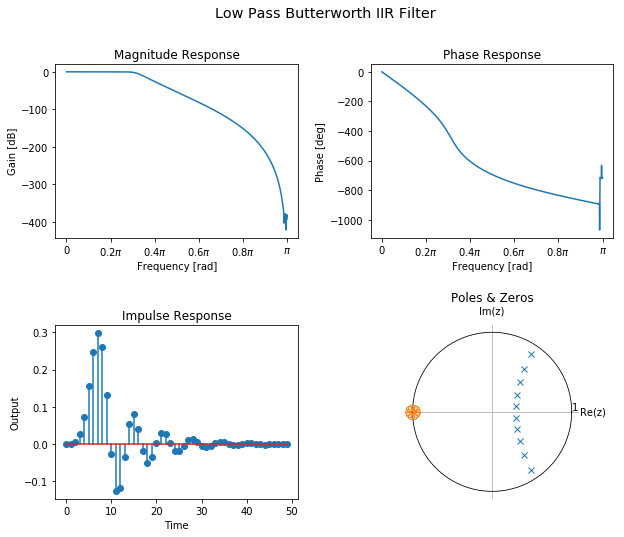

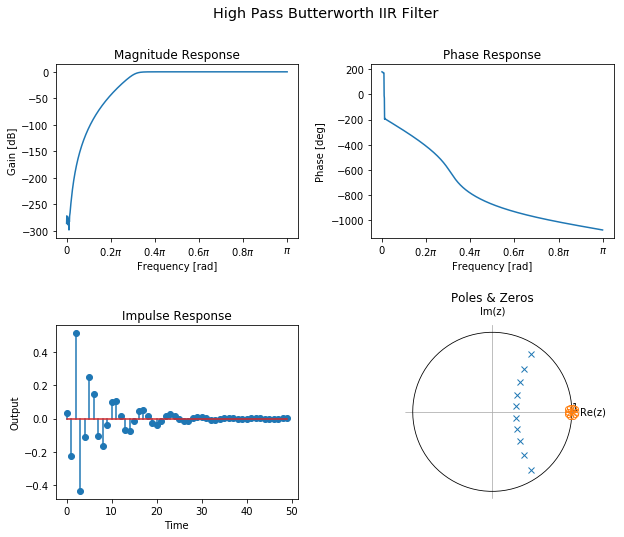

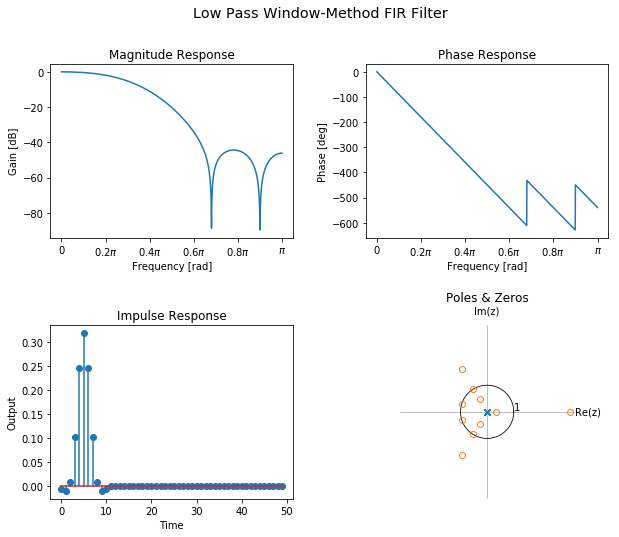

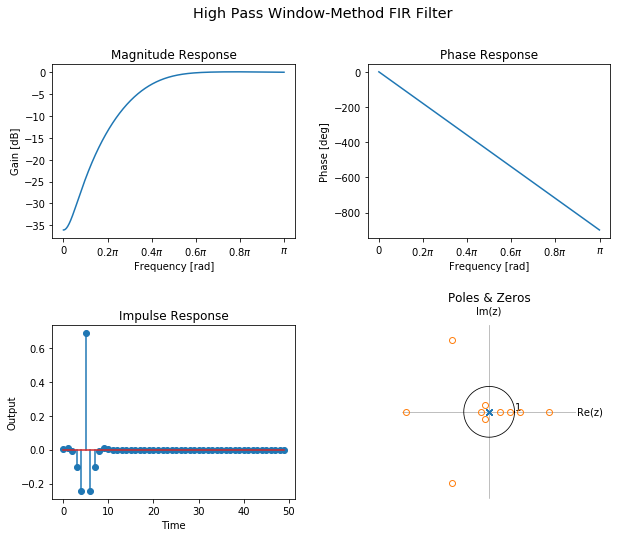

In [81]:
# Each filter should have an order of 10 and a cutoff frequency of ω=0.1𝜋.

order = 10
wc = 0.1*np.pi

# Hint: you can use signal.butter to create Butterworth filter
b, a = signal.butter(order, wc, 'lowpass')
# Use the analyze function
analyze(b, a, 'Low Pass Butterworth IIR Filter')

b, a = signal.butter(order, wc,'highpass')
# Use the analyze function
analyze(b, a, 'High Pass Butterworth IIR Filter')


# Hint: you can use signal.firwin to create Window-Method filter
b = signal.firwin(order+1,wc)
# Use the analyze function
analyze(b, 1, 'Low Pass Window-Method FIR Filter')

b = signal.firwin(order+1,wc,pass_zero=False)
# Use the analyze function
analyze(b, 1, 'High Pass Window-Method FIR Filter')


### What are the differences in the frequency response of the two filters (magnitude and phase) and how this impacts the outputs? When commenting on frequency responses, consider how close the filter matches an ideal filter.

The magnitude of the high pass filters are fairly identical, with the the butterworth having a more abrupt transition to the passband, making it a closer match to an ideal filter. Thus, the butterworth would better filter out frequencies for the outputs. Phase-wise, the FIR filter had a smoother (perfectly linear) phase response, where the butterworth had more bumps. Thus, the phase of the butterworth may be slightly unstable at the bumpy points.

The magnitude of the low pass filters are different, with the the butterworth having a more stable transition to the stopband, making it a closer match to an ideal filter. The FIR filter has some bumps at higher frequencies. Thus, the outputs will have frequencies better (more accurate and stable) filtered out with the butterworth filter. Phase-wise, they are fairly similar. The Butterworth filter had a smoother phase response, where the FIR has some sharp transitions, making the output's phase more smooth with the butterworth filter.





### Apply each filter to the each of the following signals:
1. The data in `microsoft_stock.txt`
2. A pulse of length 20: 𝑥[𝑛]=𝑢[𝑛]−𝑢[𝑛−20]

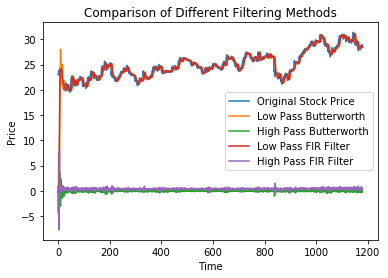

In [82]:
# Load the Microsoft stock data
data = np.genfromtxt('microsoft_stock.txt')

# obtain the coefficient of the low pass filter using signal.butter 
b, a = signal.butter(order, wc, 'lowpass')
# Apply the filter with the coefficients to the stock data (you can use signal.lfilter)
output1 = signal.lfilter(b,a,data)


# obtain the coefficient of the high pass filters using signal.butter 
b, a = signal.butter(order, wc, 'highpass')
# Apply the filter with the coefficients to the stock data (you can use signal.lfilter)
output2 = signal.lfilter(b,a,data)

# obtain the coefficient of the low pass filters using signal.firwin 
b = signal.firwin(order+1,wc)
# Apply the filter with the coefficients to the stock data (you can use signal.lfilter)
output3 = signal.lfilter(b,1,data)

# obtain the coefficient of high pass filters using signal.firwin 
b = signal.firwin(order+1,wc,pass_zero=False)
# Apply the filter with the coefficients to the stock data (you can use signal.lfilter)
output4 = signal.lfilter(b,1,data)

# plot the results
plt.title('Comparison of Different Filtering Methods')
plt.xlabel('Time')
plt.ylabel('Price')
plt.plot(data,label='Original Stock Price')
plt.plot(output1, label='Low Pass Butterworth')
plt.plot(output2, label='High Pass Butterworth')
plt.plot(output3, label='Low Pass FIR Filter')
plt.plot(output4, label='High Pass FIR Filter')
plt.legend()
plt.show()

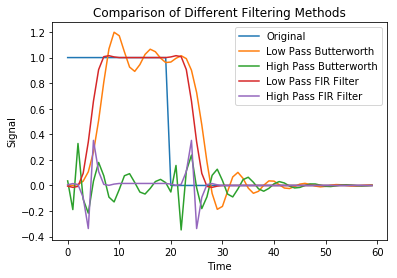

In [83]:
# Create a pulse of length 20: x[n] = u[n]-u[n-20] where 0 <= n < 60
x = np.concatenate([np.ones(20), np.zeros(40)])


# Low Pass Butterworth filter (you can use signal.butter)
b, a = signal.butter(order,wc,'lowpass')
# Apply the filter to x (you can use signal.lfilter)
y_butterlow = signal.lfilter(b,a,x)

# Low Pass window-method filter (you can use signal.firwin)
b = signal.firwin(order+1,wc)
# Apply the filter to x (you can use signal.lfilter)
y_firlow = signal.lfilter(b,1,x)

# High Pass Butterworth filter (you can use signal.butter)
b, a = signal.butter(order,wc,'highpass')
# Apply the filter to x
y_butterhigh = signal.lfilter(b,a,x)

# High Pass window-method filter(you can use signal.firwin)
b = signal.firwin(order+1,wc,pass_zero=False)
# Apply the filter to x (you can use signal.lfilter)
y_firhigh = signal.lfilter(b,1,x)

# plot the results
plt.title('Comparison of Different Filtering Methods')
plt.xlabel('Time')
plt.ylabel('Signal')
plt.plot(x,label='Original')
plt.plot(y_butterlow, label='Low Pass Butterworth')
plt.plot(y_butterhigh, label='High Pass Butterworth')
plt.plot(y_firlow, label='Low Pass FIR Filter')
plt.plot(y_firhigh, label='High Pass FIR Filter')
plt.legend()
plt.show()

## Task 3: Audio Equalizer

In this section, we will implement an audio equalizer using three different filters. 
We will learn how to use the provided `wav_load` and `play` functions to load and play the audio file.

In [84]:
# Load a WAV file. 
# Return the sampling rate and the sample array. 
def wav_load(file_name): 
    # Load the raw data. 
    sr, data = wav.read(file_name) 
    # Only use the first channel. 
    if data.ndim > 1: 
        data = data[:, 0] 
    
    # Convert to float32 quantization. 
    kind = data.dtype.kind 
    bits = data.dtype.itemsize * 8 
    data = data.astype('float32') 
    if kind == 'i' or kind == 'u': 
        data = data / 2 ** (bits - 1) 
        if kind == 'u': 
            data = data - 1 
    return sr, data

def play(samples, sample_rate): 
    sa.play_buffer((np.clip(samples, -1, 1) * 32767).astype('int16'), 1, 2, sample_rate).wait_done()

Then, we will implement the equalizer by writing a function `equalizer` including 4 steps:

1. take a sound signal and the gain terms 𝐺1,𝐺2 and 𝐺3 as inputs
2. apply the filters
3. multiply the filter outputs by the gain terms
4. sum the results

In addition, the gain terms supplied to the function should be in decibels (dB). For example, if the gain term is 0 dB, it means that

   sound level = 20 log ($p_{measured}/p_{reference}$) = 20 log 1 = 0 dB
                                  
This level occurs when the measured intensity $p_{measured}$ is equal to the reference level $p_{reference}$.

To determine which filter coefficients represent which type of filter, we can use the analyze function provided in Task 2. 
\[b2, a2\] are a low pass filter. \[b1, a1\] are a band pass filter. \[b3, a3\] are a high pass filter. 

In [85]:

def equalizer(samples, g1, g2, g3):
    
    b1 = np.array([11.713, 0, -23.4257, 0, 11.713])
    a1 = np.array([1800, -6656.7, 9341, -5896.1, 1413.4])
    
    b2 = [0.2982, 0.89471, 0.89471, 0.2982] 
    a2 = [1800, -4989.8, 4625.2, -1433]
    
    b3 = [688.1, -2752.5, 4128.71, -2752.47, 688.12] 
    a3 = [1000, -3256.6, 4033.77, -2246, 473.51]    

    # Apply the filter (you can use signal.lfilter)
    y1 = signal.lfilter(b1,a1,samples)
    y2 = signal.lfilter(b2,a2,samples)
    y3 = signal.lfilter(b3,a3,samples)
    
    # Multiply the filter outputs by the gain terms
    G1 = 10**(g1/20)
    G2 = 10**(g2/20)
    G3 = 10**(g3/20)
    y1 = G1*y1
    y2 = G2*y2
    y3 = G3*y3
    
    return y1 + y2 + y3

In [86]:
# load the audio file
sample_rate, data = wav_load('music.wav')
# play the audio
play(data, sample_rate)

In [87]:
# apply the equalizer, the gain terms 𝐺1 = 𝐺2 = 𝐺3 = 0 dB
new_data = equalizer(data, 0, 0, 0)
# verify that it sounds the same as the original input
play(new_data, sample_rate)

### Determine which filter coefficients represent which type of filter. 

Hint: you can use the analyze function provided in Task 2. 

Filter coefficients `a1, b1` represent  `___bandpass______`  filter

Filter coefficients `a2, b2` represent  `___lowpass_______`  filter

Filter coefficients `a3, b3` represent  `____highpass______`  filter

### Filter out the high frequency content from the signal. It should sound less shrill.

In [88]:
# apply the equalizer with three gain terms 
G1 = 0
G2 = 0
G3 = -40
new_data = equalizer(data, G1, G2, G3)
# verify that it sounds less shrill than the original input
play(new_data, sample_rate)

### Filter out the low frequency content from the signal. It should sounds sharper.

In [89]:
# apply the equalizer with three gain terms 
G1 = 0
G2 = -40
G3 = 0
new_data = equalizer(data, G1, G2, G3)
# verify that it sounds less shrill than the original input
play(new_data, sample_rate)

### Discuss how the filtered sound sounds different under different sets of gains.

3d: I left the mid and low frequency ranges untouched, but gave the high frequency component a very low gain (-40 dB) which dampened out any noticeable high frequencies. It sounds a bit less shrill than the original.

3e: I left the mid and high frequency ranges untouched, but gave the low frequency component the same very low gain (-40 dB) which dampened out any noticeable low frequencies. It sounds a bit sharper than the original.

## Task 4: Spectrum analysis

In this section, we will learn how to implement and analyize the spectrum of the signal.

We will use the built-in function 'signal.spectrogram' to analyize the spectrum.
First of all, we will load the audio file 'nightingale.wav', which contains the saved snippet of a noisy digital audio transmission.

In [90]:
Audio('nightingale.wav')

Audio length: 30.51 seconds


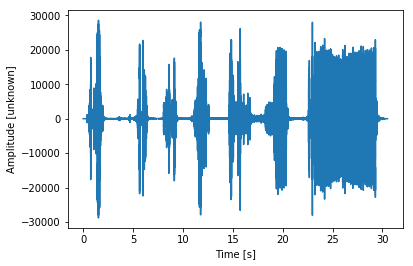

In [91]:
# We load the audio file, which gives us the sampling rate (number of measurements per second) 
# as well as audio data as an (N, 2) array—two columns because this is a stereo recording.
rate, audio = wavfile.read('nightingale.wav')

# We convert to mono by averaging the left and right channels.
audio = np.mean(audio, axis=1)

N = audio.shape[0]
L = N / rate
print(f'Audio length: {L:.2f} seconds')

f, ax = plt.subplots()
ax.plot(np.arange(N) / rate, audio)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Amplitude [unknown]');

Here, we will implement a function to analyize the specturm of this audio. 

In [92]:
def show_spectrum(M, audio, L, rate):
    # M is the window size
    # chunk audio to multiple slices using a loop
    # or use python's built-in function util.view_as_windows
    slices = util.view_as_windows(audio, M, step=100)
    print(f'Audio shape: {audio.shape}, Sliced audio shape: {slices.shape}')

    # obtain the Hanning window with window size M
    n = np.arange(M)
    win = 0.5 - 0.5*np.cos(2*np.pi*n/M)

    # multiply the slices with the Hanning window
    slices = slices*win

    # easier to have one slice per column so let's transpose slices
    slices = slices.T

    # For each slice, calculate the DFT, which returns both positive and negative frequencies
    spectrum = np.fft.fft(slices,axis=0)

    # Slice out the positive frequencies for now
    spectrum = spectrum[0:len(spectrum)//2] 
    # find absolute value of the spectrum
    S = abs(spectrum)

    
    
    # The spectrum can contain both very large and very small values. 
    # Thus, do a log plot of the ratio of the signal divided by the maximum signal
    f, ax = plt.subplots(figsize=(9.6, 4.8))
    S = 20 * np.log10(S / np.max(S))
    ax.imshow(S, origin='lower', cmap='viridis', extent=(0, L, 0, rate / 2 / 1000))
    ax.axis('tight')
    ax.set_ylabel('Frequency [kHz]')
    ax.set_xlabel('Time [s]');
    
    
def python_built_in_spectrum(M, audio, L, rate):
    # built-in function
    freqs, times, Sx = signal.spectrogram(audio, fs=rate, window='hanning',
                                      nperseg=1024, noverlap=M - 100,
                                      detrend=False, scaling='spectrum')

    f, ax = plt.subplots(figsize=(9.6, 4.8))
    ax.pcolormesh(times, freqs / 1000, 10 * np.log10(Sx), cmap='viridis')
    ax.set_ylabel('Frequency [kHz]')
    ax.set_xlabel('Time [s]')

After the implementing the function `show_spectrum`, let's visualize and analyzie the spectrum.

Audio shape: (1345536,), Sliced audio shape: (13446, 1024)


C:\Users\G2945\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log10
C:\Users\G2945\Anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: divide by zero encountered in log10


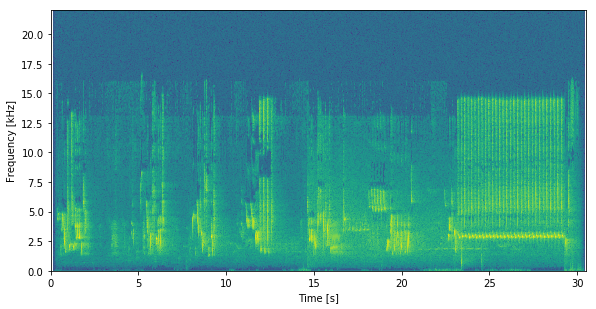

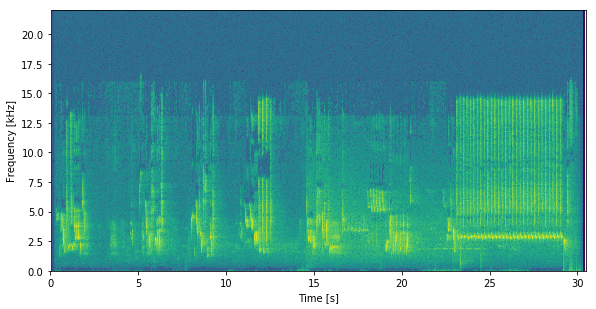

In [93]:
M = 1024
show_spectrum(M, audio, L, rate)
python_built_in_spectrum(M, audio, L, rate)

### Compare the difference between the python built-in version and your implemented function.

I can not discern any different between the two implementations. They look the exact same.

## Task 5: Audio recovering challenge
In this task, we will recover the scerete messages from a digital audio transmission file `lab3_data.csv`. 
First of all, play this audio file, and visualize its spectrum. 
WARNING! IT IS NOISY!

In [94]:
def play_result(X, Fs):
    X *= 32767 / np.max(np.abs(X))
    # convert to 16-bit data
    X = X.astype(np.int16)

    wave_obj = sa.WaveObject(X,1,2,Fs)
    play_obj = wave_obj.play()
    play_obj.wait_done()

Audio shape: (385777,), Sliced audio shape: (3848, 1024)


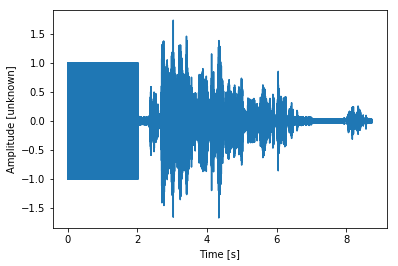

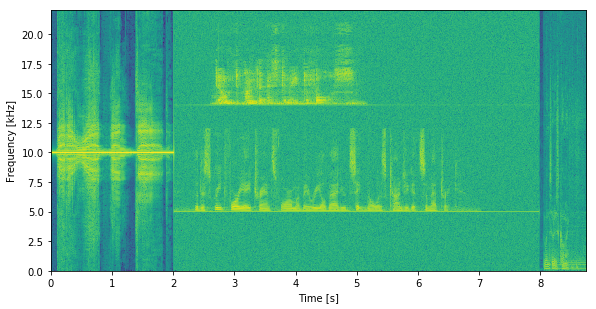

In [95]:
data = np.loadtxt('lab3_data.csv', delimiter=',')
X = data
Fs = 44100
rate = Fs
N = X.shape[0]
L = N / Fs
f, ax = plt.subplots()
ax.plot(np.arange(N) / Fs, X)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Amplitude [unknown]');

# show the specturm and play the audio using play_result()
M = 1024
show_spectrum(M, X, L, rate)
play_result(X, Fs)

Due to the loss of the decoding instructions, you must first apply your signal analysis skills with Fourier transforms to determine the bandwidth, modulated frequency location, and probable AM modulation scheme of each message channel before you can proceed to recovery of all  messages in data file `lab3_data.csv`.


Note that there are 4 messeges encoded in this digitaized data. You have recovered one of them, and now your task is to recover the other three messages.

The messages are modulated using different modulation schemes: (1) AM modulation, (2) PM modulation, (3) Quadrature Amplitude Modulation (QAM).

### 5.1: Low-pass, High-pass, and Band-pass Butterworth filters
Implement low-pass, high-pass, and band-pass Butterworth filters. We will use them to extract the signal of interest. Hint: Recall Task2!

In [96]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = fs/2
    # divide lowcut frequncy by nyq 
    low = lowcut/nyq
    # divide highcut frequncy by nyq 
    high = highcut/nyq
    # use python default function "butter" to get filter coefficients
    b, a = signal.butter(order, [low, high], 'band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    # use butter_bandpass to estimate filter coefficients
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    # create the filter with filter coefficients, and apply it on the input data
    y = signal.lfilter(b,a,data)
    return y

def butter_lowpass(cutoff, fs, order=5):
    nyq = fs/2
    # divide cutoff frequency by nyq
    cutoff = cutoff/nyq
    # use python default function "butter" to estimate filter coefficients
    b, a = signal.butter(order,cutoff,'lowpass')
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    # use butter_lowpass to estimate filter coefficients
    b, a = butter_lowpass(cutoff,fs,order)
    # create the filter with filter coefficients, and apply it on the input data
    y = signal.lfilter(b,a,data)
    return y

def butter_highpass(cutoff, fs, order=5):
    nyq = fs/2
    # divide cutoff frequency by nyq
    cutoff = cutoff/nyq
    # use python default function "butter" to estimate filter coefficients
    b, a = signal.butter(order, cutoff, 'highpass')
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    # use butter_highpass to estimate filter coefficients
    b, a = butter_highpass(cutoff,fs,order)
    # create the filter with filter coefficients, and apply it on the input data
    y = signal.lfilter(b,a,data)
    return y

#### Test the bandpass filter you created. Here, we assume `lowcut=5000.0` and `highcut=10500.0`. 
#### Also visualize the frequency response of the created filter

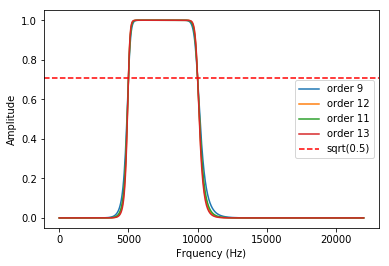

In [97]:
# Sample rate and desired cutoff frequencies (in Hz).
fs     = Fs
lowcut = 5000.0
highcut = 10000.0
# worN

# Plot the frequency response for a few different orders.
plt.figure(1)
plt.clf()
# you can use a for-loop and compute filter coeficients for each order [9, 11, 12, 13]
for order in [9, 12, 11, 13]:
    # use your butter_bandpass to estimate filter coefficients
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    # use python's scipy.signal.freqz to compute the frequency response of the digital filter
    w, h = signal.freqz(b,a)
    # plot frequency response
    plt.xlabel('Frquency (Hz)')
    plt.ylabel('Amplitude')
    plt.plot(w*fs/(2*np.pi),abs(h),label=f'order {order}')
plt.axhline(y=np.sqrt(0.5), color='r', linestyle='--', label='sqrt(0.5)')
plt.legend()

### 5.2 Extract signal of interest with bandpass filter

There are 4 different messages in this file. We will extract each signal, and demodulate the signal. First of all we will extract one of the 4 signal from `2 sec` to `8 sec` (that is `data[Fs*2:Fs*8]`). 

Assume `lowcut=5000.0` and `highcut=10500.0`


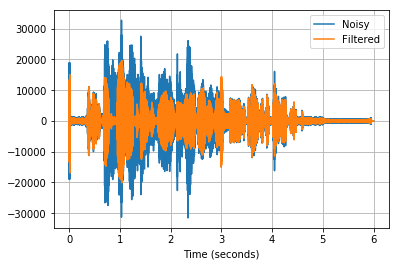

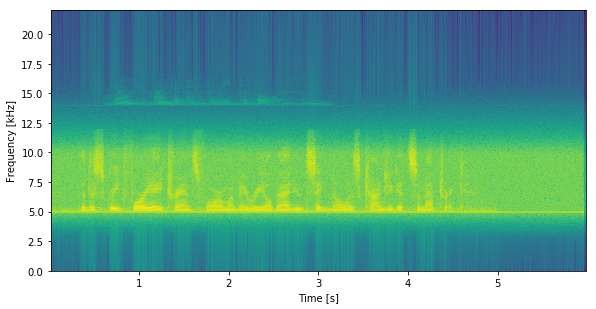

In [98]:
X = data[Fs*2:Fs*8]
M = 1024
Fs = 44100
L = len(X)/Fs

lowcut = 5000.0
highcut = 10000.0

#time series
n = np.arange(len(X))/Fs

# plot the original signal in time domain
plt.plot(n, X,label='Noisy')


# apply your bandpass filter on the signal     
# hint: use oder=11
Xf = butter_bandpass_filter(X, lowcut, highcut, Fs, 11)

# plot the filtered signal in time domain
plt.plot(n,Xf,label='Filtered')
plt.xlabel('Time (seconds)')
plt.grid()
plt.legend()
plt.show()

# show the specturm of the filtering result
# hint: you can use show_spectrum or python_built_in_spectrum
python_built_in_spectrum(M, Xf, L, Fs)

### Task 5.3 Cosine demodulation

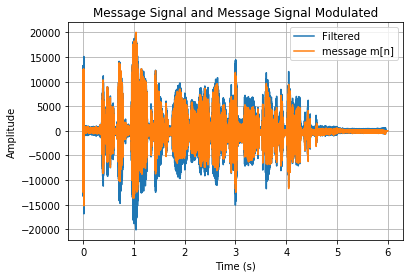

Audio shape: (264600,), Sliced audio shape: (2636, 1024)


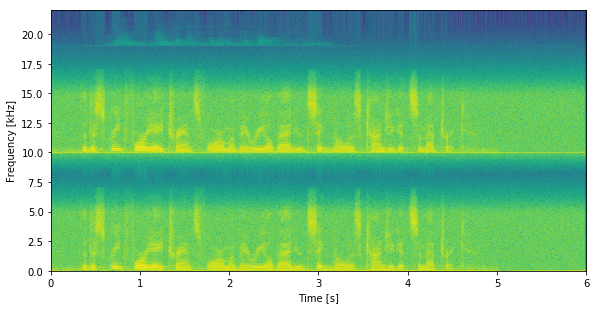

In [99]:
# compute carrier frequency fo
# hint: in this case it is the difference between highcut and lowcut
fo = highcut-lowcut

# AM demodulation: multiply the singal with aa sinosoid signal
am_demodulated = Xf*np.cos(2*np.pi*fo*n)

plt.plot(n,Xf,label='Filtered')
plt.plot(n,am_demodulated,label='message m[n]')
plt.title('Message Signal and Message Signal Modulated')
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
plt.legend()
plt.grid()
plt.show()

# show the spectrum of the demodulated signal
# hint: you can use show_spectrum or python_built_in_spectrum
M = 1024
show_spectrum(M, am_demodulated, L, rate)

### Task 5.3 low-pass filter

Audio shape: (264600,), Sliced audio shape: (2636, 1024)


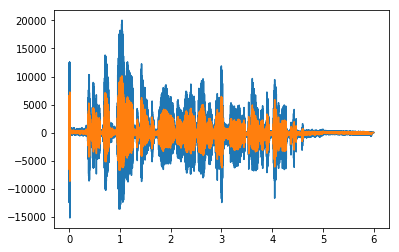

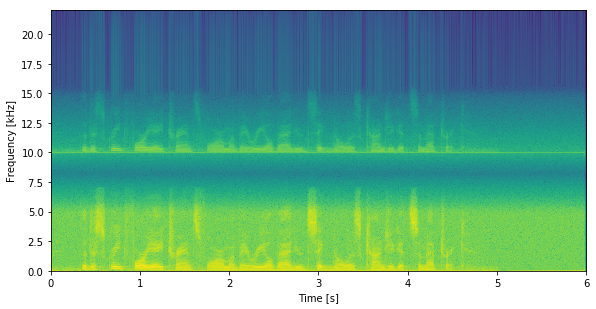

In [100]:
# Sample rate and desired cutoff frequencies (in Hz).
fs     = Fs
order = 12

# determine the cutoff frequency based on spectrum analysis
cutoff = 7500

# apply the low-pass filter on the demodulated signal 
y = butter_lowpass_filter(am_demodulated, cutoff, fs, order)

# plot the signal before and after low-pass filtering in time domain
plt.plot(n, am_demodulated, label='Before Lowpass Filtering')
plt.plot(n, y, label='After Lowpass Filtering')


# show the specturm of the filtering result
# hint: you can use show_spectrum or python_built_in_spectrum
M = 1024 
show_spectrum(M, y, L, rate)

Finally done! Let's play the demodulated signal! Did you discover the screte message from the noisy audio?

In [101]:
play_result(y, Fs)

In [102]:
#the discrete fourier transform of a real valued signal is conjugate symmetric

### What message did you recover? Report and discuss your result.

## Next, recover another message in `data[Fs*2:Fs*8]`

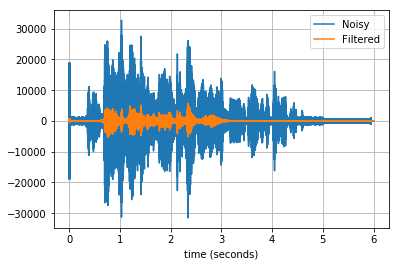

6.0
Audio shape: (264600,), Sliced audio shape: (2636, 1024)
Audio shape: (264600,), Sliced audio shape: (2636, 1024)
Audio shape: (264600,), Sliced audio shape: (2636, 1024)
Audio shape: (264600,), Sliced audio shape: (2636, 1024)


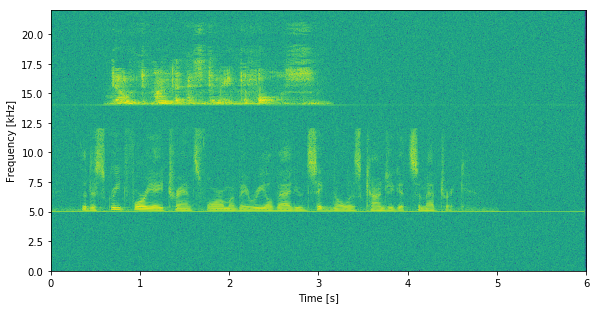

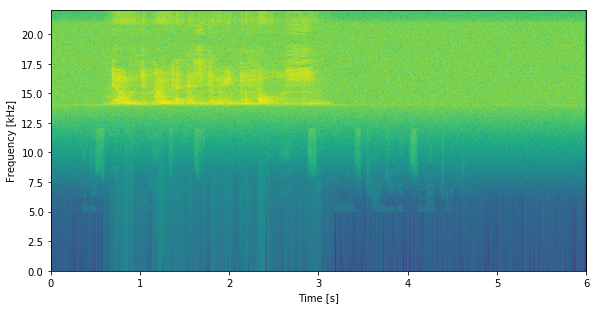

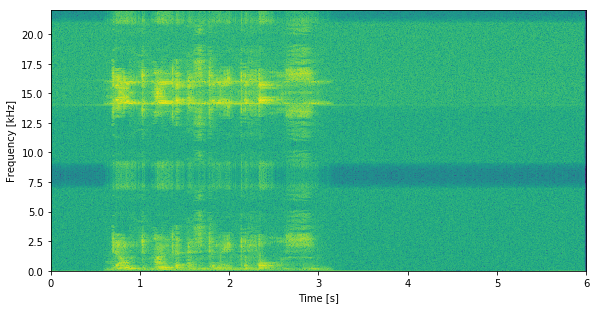

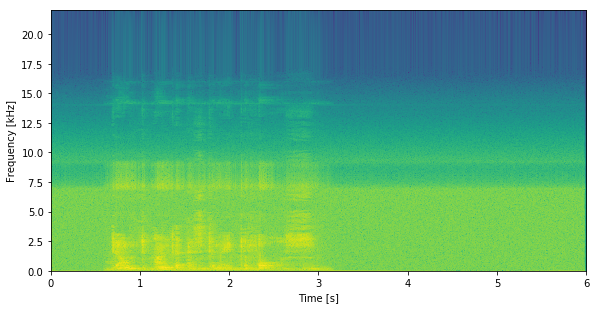

In [103]:
# get the data
X = data[Fs*2:Fs*8]
Fs = 44100
rate = Fs
N = X.shape[0]
L = N / Fs
M = 1024 
order = 12
lowcut = 14000
highcut = 21000
fo = highcut-lowcut
cutoff=7500

n = np.arange(len(X))/Fs

# Visualize spectrum and play the audio
#play_result(X, Fs)

# It is your showtime to recover the message!
Xf2 = butter_bandpass_filter(X, lowcut, highcut, Fs, order)
am_demodulated2 = Xf2*np.cos(2*np.pi*fo*n)*np.cos(2*np.pi*fo*n)

y = butter_lowpass_filter(am_demodulated2, cutoff, fs, order)

plt.plot(n,X,label='Noisy')
plt.plot(n,y,label='Filtered')
plt.xlabel('time (seconds)')
plt.legend()
plt.grid()
plt.show()
#duration
print(L)
show_spectrum(M, X, L, rate)
show_spectrum(M, Xf2, L, rate)
show_spectrum(M, am_demodulated2, L, rate)
show_spectrum(M, y, L, rate)



In [104]:
play_result(y, Fs)

### What message did you recover? Report and discuss your result.

In [105]:
#don't underestimate the force

## Recover another message in `data[Fs*8:]`

Audio shape: (32977,), Sliced audio shape: (320, 1024)
Audio shape: (65954,), Sliced audio shape: (650, 1024)
Audio shape: (65954,), Sliced audio shape: (650, 1024)


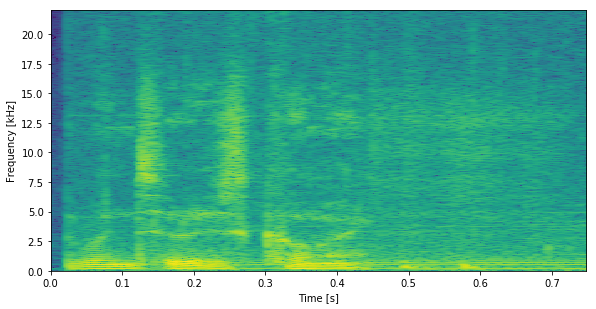

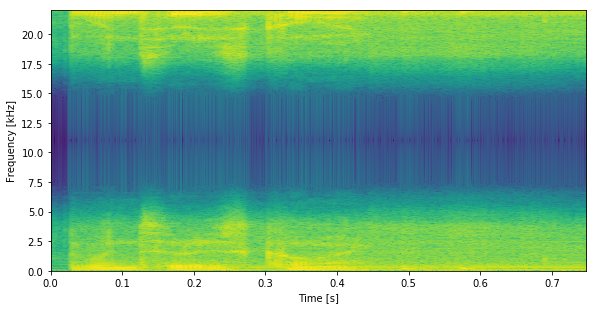

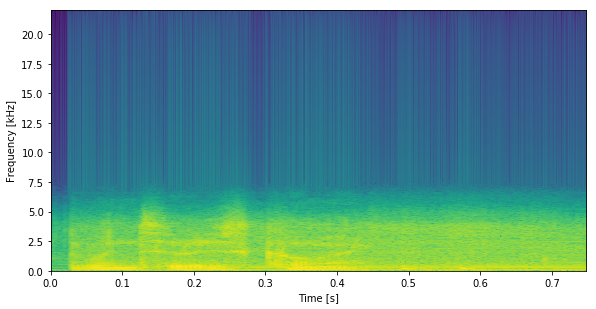

In [106]:
# load data
data = np.loadtxt('lab3_data.csv', delimiter=',')
X = data[Fs*8:]
Fs = 44100
rate = Fs
N = X.shape[0]
L = N / Fs
M = 1024 

lowcut = 7000
highcut = 13000
fo=highcut-lowcut

n = np.arange(len(X))/Fs
n2 = np.arange(len(X)*2)/Fs

# Visualize spectrum and play the audio
#play_result(X, Fs)

# It is your showtime to recover the message!
# even_bits_demod = X*np.cos(2*np.pi*fo*n)*np.cos(2*np.pi*fo*n)
# odd_bits_demod = X*np.sin(2*np.pi*fo*n)*np.sin(2*np.pi*fo*n)

even_bits_demod = X*np.cos(2*np.pi*fs*n)
odd_bits_demod = X*np.sin(2*np.pi*fs*n)


even_bits_fi = butter_lowpass_filter(even_bits_demod, cutoff, fs, order)
odd_bits_fi = butter_lowpass_filter(odd_bits_demod, cutoff, fs, order)

result_fi = np.zeros(len(even_bits_fi)+len(odd_bits_fi))
result_fi[::2] = even_bits_fi
result_fi[1::2] = odd_bits_fi

cutoff = 7500
y = butter_lowpass_filter(result_fi, cutoff, fs, order)
# plt.plot(n,X,label='Noisy')
# plt.plot(n,result_fi,label='Filtered')
# plt.xlabel('time (seconds)')
# plt.legend()
# plt.grid()
# plt.show()

show_spectrum(M, X, L, rate)
show_spectrum(M, result_fi, L, rate)
show_spectrum(M, y, L, rate)

In [115]:
play_result(y, Fs)

### What message did you recover? Report and discuss your result.

In [108]:
#winter is coming

## Recover the final message in `data [Fs*0:Fs*2]`

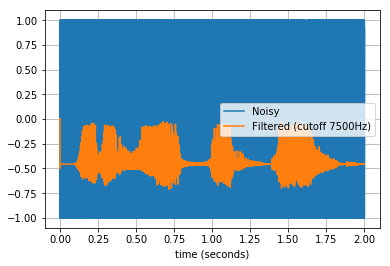

Audio shape: (88200,), Sliced audio shape: (872, 1024)
Audio shape: (88200,), Sliced audio shape: (872, 1024)
Audio shape: (88200,), Sliced audio shape: (872, 1024)


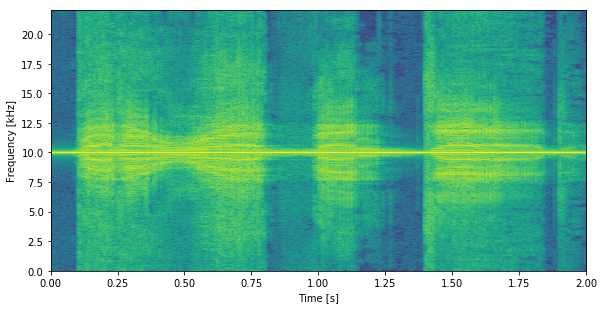

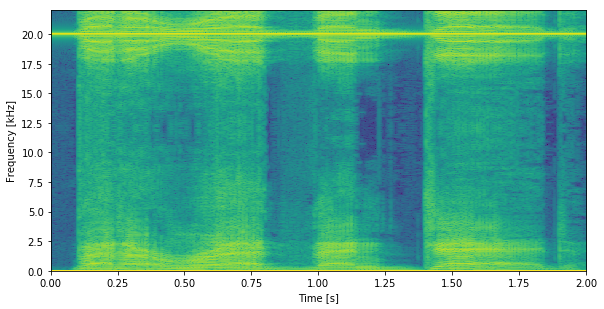

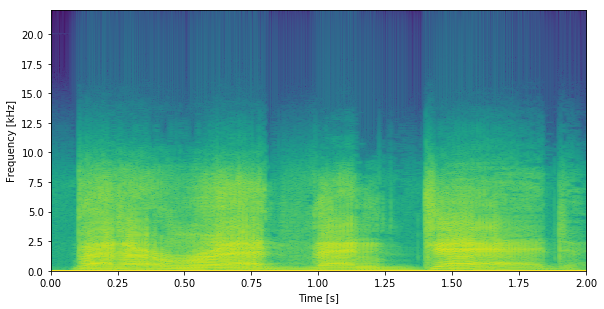

In [109]:
# load data
data = np.loadtxt('lab3_data.csv', delimiter=',')
X = data[Fs*0:Fs*2]
Fs = 44100
rate = Fs
N = X.shape[0]
L = N / Fs
cutoff = 7500
fcarrier = 10000
n = np.arange(len(X))/Fs

# Visualize spectrum and play the audio
Xhf = butter_highpass_filter(X, cutoff, Fs, 11)
x_mod = Xhf*np.cos(2*np.pi*fcarrier*n)
Xlp = butter_lowpass_filter(x_mod, cutoff, Fs, 11)

plt.plot(n,X,label='Noisy')
plt.plot(n,Xlp,label='Filtered (cutoff 7500Hz)')
plt.xlabel('time (seconds)')
plt.legend()
plt.grid()
plt.show()

show_spectrum(M, X, L, rate)
show_spectrum(M, x_mod, L, rate)
show_spectrum(M, Xlp, L, rate)

In [114]:
play_result(Xlp, Fs)

### What message did you recover? Report and discuss your result.

In [113]:
#better red than dead

In [112]:
#note: {[argument_index_or_keyword]:[width][.precision][type]}
import math
print("Floating point {0:10.3f}".format(math.pi))   

Floating point      3.142
